In [2]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np
import tifffile
from torch.utils.data import DataLoader

In [3]:
lut_colors = {
    1: '#db0e9a',
    2: '#938e7b',
    3: '#f80c00',
    4: '#a97101',
    5: '#1553ae',
    6: '#194a26',
    7: '#46e483',
    8: '#f3a60d',
    9: '#660082',
    10: '#55ff00',
    11: '#fff30d',
    12: '#e4df7c',
    # 13: '#3de6eb',
    # 14: '#ffffff',
    # 15: '#8ab3a0',
    # 16: '#6b714f',
    # 17: '#c5dc42',
    # 18: '#9999ff',
    13: '#000000'}

colors_list = [lut_colors[key] for key in lut_colors.keys()]
N = len(colors_list)
custom_cmap = mcolors.ListedColormap(colors_list, name='custom_lut_map')
boundaries = np.arange(N + 1) - 0.5
custom_norm = mcolors.BoundaryNorm(boundaries, N)

Array shape: (512, 512, 5)
Data type: uint8
Dimensionality number: 3
Number of channels: 5


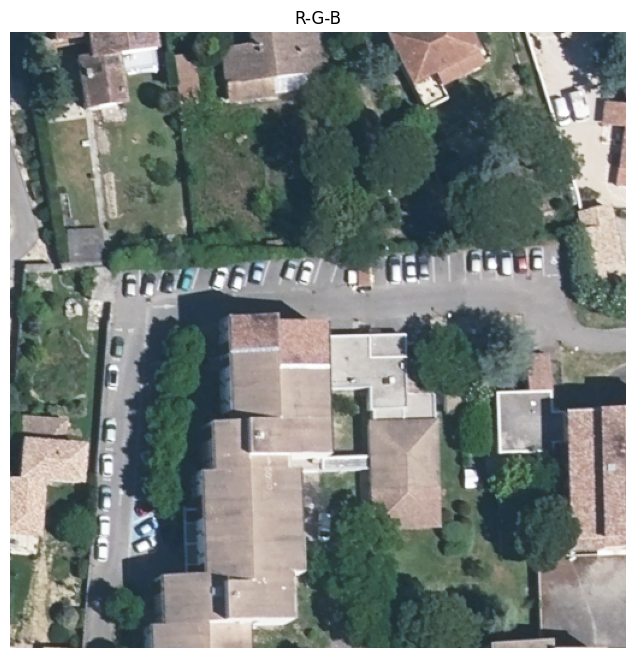

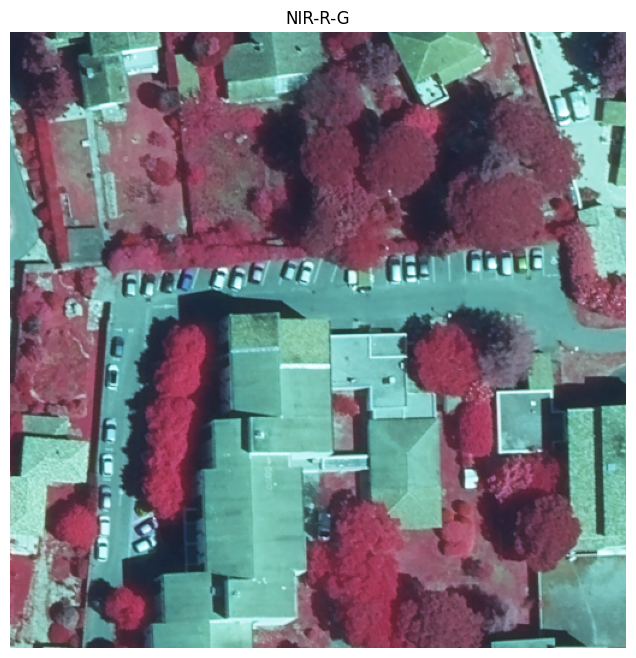

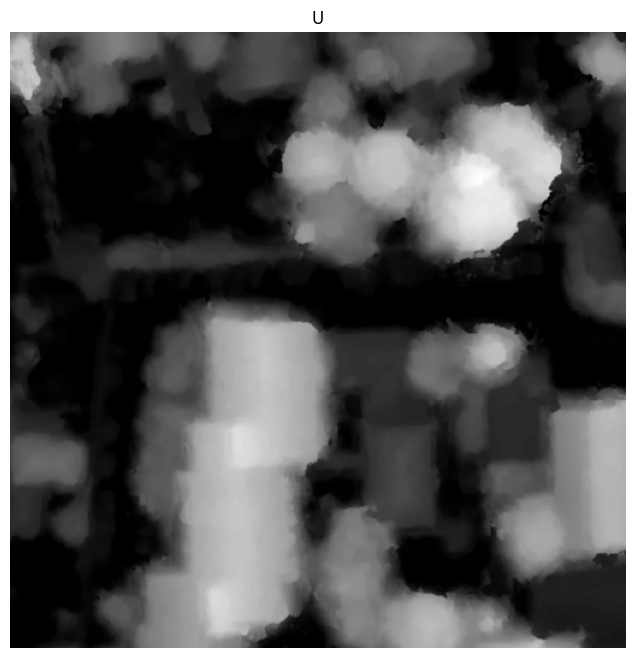

FileNotFoundError: [Errno 2] No such file or directory: '/home/prajter/PycharmProjects/Flair-2/data/split_30/test/masks/IMG_093435.tif'

In [5]:
file_path = '/home/prajter/PycharmProjects/Flair-2/data/split_30/test/images/IMG_093435.tif'
file_path_mask = '/home/prajter/PycharmProjects/Flair-2/data/split_30/test/masks/IMG_093435.tif'

img_array = tifffile.imread(file_path)
print(f"Array shape: {img_array.shape}")
print(f"Data type: {img_array.dtype}")
print(f"Dimensionality number: {img_array.ndim}")

num_channels = img_array.shape[-1]
print(f"Number of channels: {num_channels}")

rgb = img_array[:, :, :3]
plt.figure(figsize=(8, 8))
plt.imshow(rgb)
plt.title("R-G-B")
plt.axis('off')
plt.show()

nirrg = img_array[:, :, [3, 0, 1]]
plt.figure(figsize=(8, 8))
plt.imshow(nirrg)
plt.title("NIR-R-G")
plt.axis('off')
plt.show()

elevation = img_array[:, :, -1]
plt.figure(figsize=(8, 8))
plt.imshow(elevation, cmap="gray")
plt.title("U")
plt.axis('off')
plt.show()

mask_array = tifffile.imread(file_path_mask)
mask_array = np.where(mask_array >= 13, 13, mask_array)
print(f"Array shape: {mask_array.shape}")
print(f"Data type: {mask_array.dtype}")
print(f"Dimensionality number: {mask_array.ndim}")

# plt.figure(figsize=(8, 8))
# plt.imshow(mask_array, cmap=custom_cmap, norm=custom_norm)
# plt.title("Labels")
# plt.axis('off')
# plt.show()

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

plt.figure(figsize=(10, 8))
mask_array -= 1
plt.imshow(mask_array, cmap=custom_cmap, norm=custom_norm)
plt.title("Labels")
plt.axis('off')

legend_patches = []
for (key, color) in lut_colors.items():
    patch = mpatches.Patch(color=color, label=key)
    legend_patches.append(patch)

plt.legend(handles=legend_patches, bbox_to_anchor=(0.5, -0.05),
           loc='upper center', ncol=min(5, len(legend_patches)),
           fontsize=10, frameon=True)

plt.tight_layout()
plt.show()

In [24]:
# import torch
# from torch.utils.data import Dataset
# import tifffile
# from pathlib import Path
# import re
# 
# 
# class FlairDataset(Dataset):
#     def __init__(self, image_dir: Path, mask_dir: Path, image_transform=None, mask_transform=None,
#                  selected_channels: list[int] | None = None):
#         self.image_dir = Path(image_dir)
#         self.mask_dir = Path(mask_dir)
#         self.image_transform = image_transform
#         self.mask_transform = mask_transform
#         self.selected_channels = selected_channels
# 
#         self.features_dict = {self._get_unique_id(path.name): path for path in
#                               sorted(self.image_dir.rglob("IMG_*.tif"))}
#         self.labels_dict = {self._get_unique_id(path.name): path for path in sorted(self.mask_dir.rglob("MSK_*.tif"))}
# 
#         self.ids = list(set(self.features_dict.keys()) & set(self.labels_dict.keys()))
# 
#     def __len__(self):
#         return len(self.ids)
# 
#     def __getitem__(self, idx):
#         if idx >= len(self):
#             raise IndexError
# 
#         id_ = self.ids[idx]
#         feature_path = self.features_dict[id_]
#         label_path = self.labels_dict[id_]
# 
#         X = tifffile.imread(feature_path)
#         y = tifffile.imread(label_path)
#         y = np.where(y <= 12, y, 13)  # w oryginalnym datasecie rowniez zmniejszono liczbe klas (dodano klase inne)
#         y -= 1  # funkcja straty oczekuje, ze labele beda zaczybnac sie od zera
# 
#         X = torch.from_numpy(X).float()
# 
#         if X.ndim == 3:
#             X = X.permute(2, 0, 1)
# 
#         if self.selected_channels is not None:
#             X = X[self.selected_channels, :, :]
# 
#         y = torch.from_numpy(y).long()
# 
#         if self.image_transform is not None:
#             X = self.image_transform(X)
# 
#         if self.mask_transform is not None:
#             y = self.mask_transform(y)
# 
#         return X, y
# 
#     def _get_unique_id(self, filename):
#         match = re.search(r"(\d+)", filename)
#         return match.group(1)

In [33]:
import torch
from torch.utils.data import Dataset
import tifffile
from pathlib import Path
import re
import numpy as np
import torch.nn.functional as F
from typing import Optional, Union, Callable


class FlairDataset(Dataset):
    def __init__(self, image_dir: Optional[Union[Path, str]], mask_dir: Optional[Union[Path, str]], num_classes: int,
                 image_transform: Optional[Callable] = None, mask_transform: Optional[Callable] = None,
                 selected_channels: Optional[list[int]] = None):
        """Initialize the FLAIR dataset.
        
        Args:
            image_dir: Directory containing image files (IMG_*.tif)
            mask_dir: Directory containing mask files (MSK_*.tif)
            num_classes: Number of segmentation classes
            image_transform: Optional transform to apply to images
            mask_transform: Optional transform to apply to masks
            selected_channels: Optional list of channels to select from images
        """
        self.image_dir = Path(image_dir)
        self.mask_dir = Path(mask_dir)
        self.num_classes = num_classes
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.selected_channels = selected_channels

        # mapping from unique ids to file paths to image and mask files
        self.features_dict = self._get_path_mapping(self.image_dir, "IMG_*.tif")
        self.labels_dict = self._get_path_mapping(self.mask_dir, "MSK_*.tif")

        # shared ids between images and masks files
        self.ids = list(set(self.features_dict.keys()) & set(self.labels_dict.keys()))

    def _get_unique_id(self, filename) -> str:
        """Extract unique ID from filename.
        
        Args:
            filename: Name of the file
            
        Returns:
            Extracted ID from the filename
        """
        match = re.search(r"(\d+)", filename)
        return match.group(1)

    def _get_path_mapping(self, path: Path, pattern: str) -> dict[str, Path]:
        return {self._get_unique_id(path.name): path for path in
                sorted(path.rglob(pattern))}

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        """Get a sample from the dataset.
        
        Args:
            idx: Index of the sample
            
        Returns:
            Tuple of (image, mask) where mask is one-hot encoded
            
        Raises:
            IndexError: If idx is out of range
        """
        if idx >= len(self):
            raise IndexError(f"Index {idx} out of range for dataset of size {len(self)}")

        id_ = self.ids[idx]
        feature_path = self.features_dict[id_]
        label_path = self.labels_dict[id_]

        X = tifffile.imread(feature_path)
        y = tifffile.imread(label_path)

        # Masks preprocessing: add class 13 for "other" and shift to 0-based indexing
        y = np.where(y <= 12, y, 13)
        y -= 1

        X = torch.from_numpy(X).float()

        if X.ndim == 3:
            X = X.permute(2, 0, 1)

        if self.selected_channels is not None:
            X = X[self.selected_channels, :, :]

        y = torch.from_numpy(y).long()

        y_one_hot = F.one_hot(y, num_classes=self.num_classes).permute(2, 0, 1)
        y_one_hot = y_one_hot.half()

        if self.image_transform is not None:
            X = self.image_transform(X)

        if self.mask_transform is not None:
            y_one_hot = self.mask_transform(y_one_hot)
        return X, y_one_hot

    def get_class_counts(self) -> torch.Tensor:
        """Calculate the distribution of classes in the dataset.
        
        Returns:
            Tensor with count of pixels for each class
        """
        class_counts = torch.zeros(self.num_classes)

        for idx in range(len(self)):
            _, mask = self[idx]
            counts = mask.sum(dim=(1, 2))
            class_counts += counts

        return class_counts


In [35]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(DEVICE)
EPOCHS = 100
LEARNING_RATE = 1e-4
BATCH_SIZE = 6

ENCODER = 'resnet18'
ENCODER_WEIGHTS = 'imagenet'
IN_CHANNELS = 5
N_CLASSES = 13
ACTIVATION = None

test_dataset = FlairDataset("/home/prajter/PycharmProjects/Flair-2/data/flair_2_toy_aerial_test",
                            "/home/prajter/PycharmProjects/Flair-2/data/flair_2_toy_labels_test",
                            num_classes=13,
                            selected_channels=[0, 1, 2, 3, 4])
train_dataset = FlairDataset("/home/prajter/PycharmProjects/Flair-2/data/flair_2_toy_aerial_train",
                             "/home/prajter/PycharmProjects/Flair-2/data/flair_2_toy_labels_train",
                             num_classes=13,
                             selected_channels=[0, 1, 2, 3, 4])

train_loader = DataLoader(train_dataset, BATCH_SIZE, pin_memory=False, shuffle=True)
test_loader = DataLoader(test_dataset, BATCH_SIZE, pin_memory=False, shuffle=False)

cuda


In [36]:
import segmentation_models_pytorch as smp
import torch
import torch.optim as optim

model = smp.Unet(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    in_channels=IN_CHANNELS,
    classes=N_CLASSES,
    activation=ACTIVATION
).to(DEVICE)

In [ ]:
# from sklearn.metrics import jaccard_score
# 
# # criterion = nn.CrossEntropyLoss()
# criterion = smp.losses.DiceLoss(mode='multiclass', from_logits=True)
# optimizer = optim.Adam(models.parameters(), lr=LEARNING_RATE, weight_decay=1e-4)
# 
# patience = 20
# best_val_loss = float("inf")
# no_improve = 0
# losses_train = []
# losses_val = []
# miou_history = []
# 
# for epoch in range(EPOCHS):
#     models.train()
#     total_loss = 0
# 
#     for inputs, targets in train_loader:
#         inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)
# 
#         optimizer.zero_grad()
#         outputs = models(inputs)
# 
#         loss = criterion(outputs, targets)
#         loss.backward()
# 
#         optimizer.step()
# 
#         total_loss += loss.item()
# 
#     loss_epoch = total_loss / len(train_loader)
#     losses_train.append(loss_epoch)
#     print(f"Epoch {epoch + 1}/{EPOCHS}, Training Loss: {loss_epoch:.4f}")
# 
#     models.eval()
#     val_loss = 0
#     all_preds = []
#     all_targets = []
# 
#     with torch.no_grad():
#         for inputs, targets in test_loader:
#             inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)
#             outputs = models(inputs)
# 
#             batch_loss = criterion(outputs, targets)
#             val_loss += batch_loss.item()
# 
#             targets = targets.argmax(dim=1)
#             preds = outputs.argmax(dim=1)
#             
#             all_preds.extend(preds.cpu().numpy().flatten())
#             all_targets.extend(targets.cpu().numpy().flatten())
# 
#     val_loss /= len(test_loader)
#     losses_val.append(val_loss)
# 
#     miou = jaccard_score(all_targets, all_preds, average='macro')
#     miou_history.append(miou)
# 
#     print(f"Epoch {epoch + 1}/{EPOCHS}, Validation Loss: {val_loss:.4f}, mIoU: {miou:.4f}")
# 
#     if val_loss < best_val_loss:
#         best_val_loss = val_loss
#         no_improve = 0
#         torch.save(models.state_dict(), "models/best_model_segmentation_loss.pt")
#         print("Validation loss decreased, saving models.")
#     else:
#         no_improve += 1
#         print(f"No improvement for {no_improve} epochs.")
#         if no_improve >= patience:
#             print("Early stopping.")
#             break

In [37]:
from sklearn.metrics import jaccard_score

criterion = smp.losses.DiceLoss(mode='multiclass', from_logits=True)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)  #, weight_decay=1e-4)

patience = 20
best_val_loss = float("inf")
no_improve = 0
losses_train = []
losses_val = []
miou_history = []

for epoch in range(EPOCHS):
    model.train()
    total_loss = 0

    for inputs, targets in train_loader:
        inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)

        optimizer.zero_grad()
        outputs = model(inputs)

        targets = targets.argmax(dim=1).long()

        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    loss_epoch = total_loss / len(train_loader)
    losses_train.append(loss_epoch)
    print(f"Epoch {epoch + 1}/{EPOCHS}, Training Loss: {loss_epoch:.4f}")

    model.eval()
    val_loss = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)
            outputs = model(inputs)

            targets = targets.argmax(dim=1).long()

            batch_loss = criterion(outputs, targets)
            val_loss += batch_loss.item()

            preds = outputs.argmax(dim=1)

            all_preds.extend(preds.cpu().numpy().flatten())
            all_targets.extend(targets.cpu().numpy().flatten())

    val_loss /= len(test_loader)
    losses_val.append(val_loss)

    miou = jaccard_score(all_targets, all_preds, average='macro')
    miou_history.append(miou)

    print(f"Epoch {epoch + 1}/{EPOCHS}, Validation Loss: {val_loss:.4f}, mIoU: {miou:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        no_improve = 0
        torch.save(model.state_dict(), "models/best_model_segmentation_loss.pt")
        print("Validation loss decreased, saving models.")
    else:
        no_improve += 1
        print(f"No improvement for {no_improve} epochs.")
        if no_improve >= patience:
            print("Early stopping.")
            break


Epoch 1/100, Training Loss: 0.6586
Epoch 1/100, Validation Loss: 0.6745, mIoU: 0.0382
Validation loss decreased, saving model.
Epoch 2/100, Training Loss: 0.6670
Epoch 2/100, Validation Loss: 0.6501, mIoU: 0.0691
Validation loss decreased, saving model.
Epoch 3/100, Training Loss: 0.6345
Epoch 3/100, Validation Loss: 0.6269, mIoU: 0.0873
Validation loss decreased, saving model.
Epoch 4/100, Training Loss: 0.5999
Epoch 4/100, Validation Loss: 0.6124, mIoU: 0.0973
Validation loss decreased, saving model.
Epoch 5/100, Training Loss: 0.5694
Epoch 5/100, Validation Loss: 0.6080, mIoU: 0.0953
Validation loss decreased, saving model.
Epoch 6/100, Training Loss: 0.5739
Epoch 6/100, Validation Loss: 0.6155, mIoU: 0.0956
No improvement for 1 epochs.
Epoch 7/100, Training Loss: 0.5787
Epoch 7/100, Validation Loss: 0.6201, mIoU: 0.1037
No improvement for 2 epochs.
Epoch 8/100, Training Loss: 0.5901
Epoch 8/100, Validation Loss: 0.6138, mIoU: 0.1115
No improvement for 3 epochs.
Epoch 9/100, Trainin

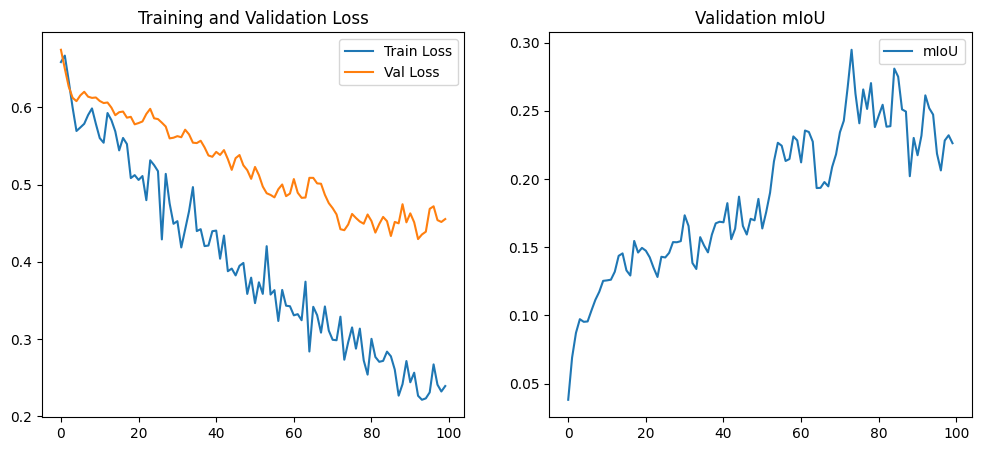

In [38]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(losses_train, label='Train Loss')
plt.plot(losses_val, label='Val Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.plot(miou_history, label='mIoU')
plt.legend()
plt.title('Validation mIoU')
plt.show()

In [39]:
model.load_state_dict(torch.load("models/best_model_segmentation_loss.pt", weights_only=True))
model.eval()

predictions = []
targets = []

with torch.no_grad():
    for inputs, target in test_loader:
        inputs, target = inputs.to(DEVICE), target.to(DEVICE)

        output = model(inputs)

        predictions.append(output.argmax(dim=1).cpu().numpy())
        targets.append(target.cpu().numpy())

In [40]:
t = []
for i in targets:
    for ii in i:
        t.extend(ii.argmax(axis=0).flatten())

p = []
for i in predictions:
    for ii in i:
        p.extend(ii.flatten())

In [41]:
jaccard_score(t, p, average='macro')

np.float64(0.2613057115595963)

np.float64(0.28285804448733576)

np.float64(0.25293177999286676)

NameError: name 'targets' is not defined

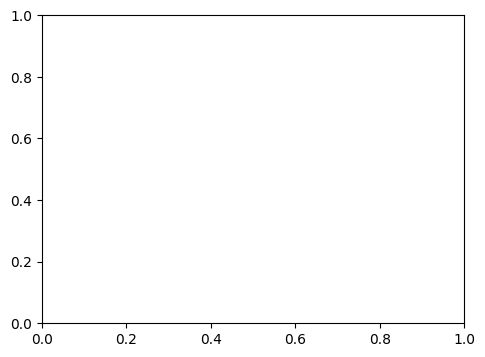

In [9]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
target = targets[0][2].argmax(axis=0)
im1 = plt.imshow(target, cmap=custom_cmap, norm=custom_norm)
plt.title("Ground Truth")
plt.axis('off')

plt.subplot(1, 2, 2)
prediction = predictions[0][2]
im2 = plt.imshow(prediction, cmap=custom_cmap, norm=custom_norm)
plt.title("Prediction")
plt.axis('off')
plt.tight_layout()
plt.show()

In [8]:
lut_colors = {
    1: '#db0e9a',
    2: '#938e7b',
    3: '#f80c00',
    4: '#a97101',
    5: '#1553ae',
    6: '#194a26',
    7: '#46e483',
    8: '#f3a60d',
    9: '#660082',
    10: '#55ff00',
    11: '#fff30d',
    12: '#e4df7c',
    13: '#000000'}

colors_list = [lut_colors[key] for key in lut_colors.keys()]
N = len(colors_list)
custom_cmap = mcolors.ListedColormap(colors_list, name='custom_lut_map')
boundaries = np.arange(N + 1) - 0.5
custom_norm = mcolors.BoundaryNorm(boundaries, N)

In [ ]:
def _get_unique_id(filename) -> str:
    match = re.search(r"(\d+)", filename)
    return match.group(1)

def _get_path_mapping( path: Path, pattern: str) -> dict[str, Path]:
    return {_get_unique_id(path.name): path for path in
            sorted(path.rglob(pattern))}

Sentinel data shape: (32, 10, 156, 207)
Data type: uint16
Min value: 0, Max value: 17053
Number of dimensions: 4
Dimension 0 size: 32
Dimension 1 size: 10
Dimension 2 size: 156
Dimension 3 size: 207
Using timestep 5, shape: (32, 156, 207)


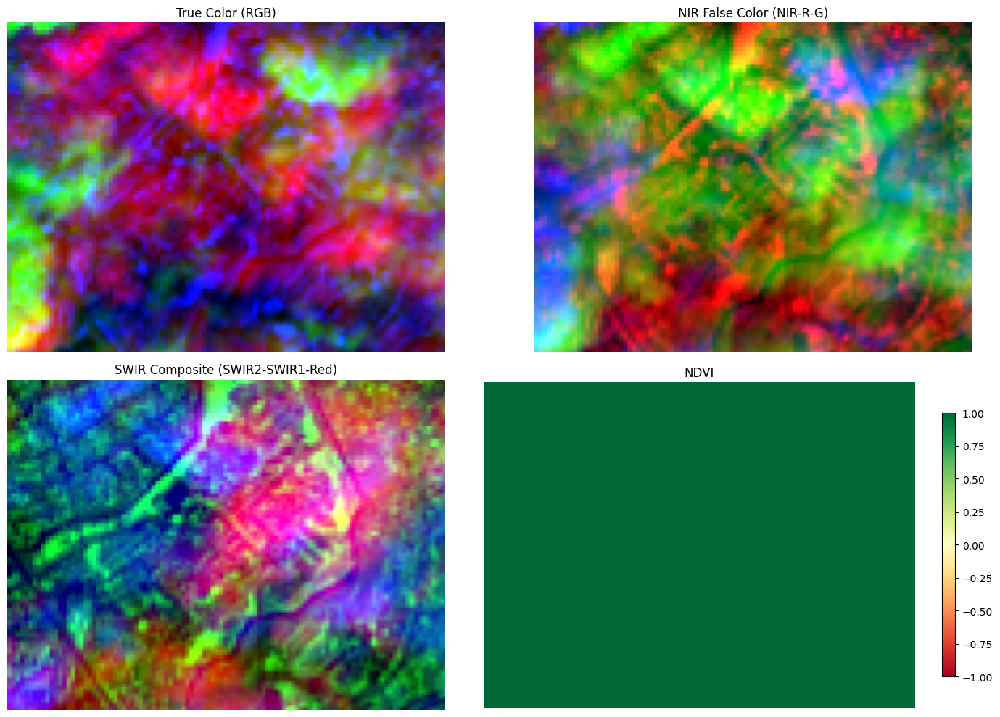

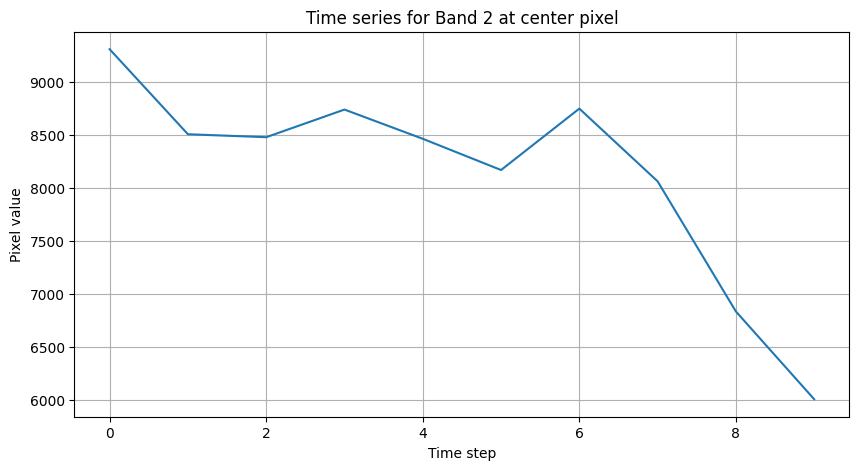

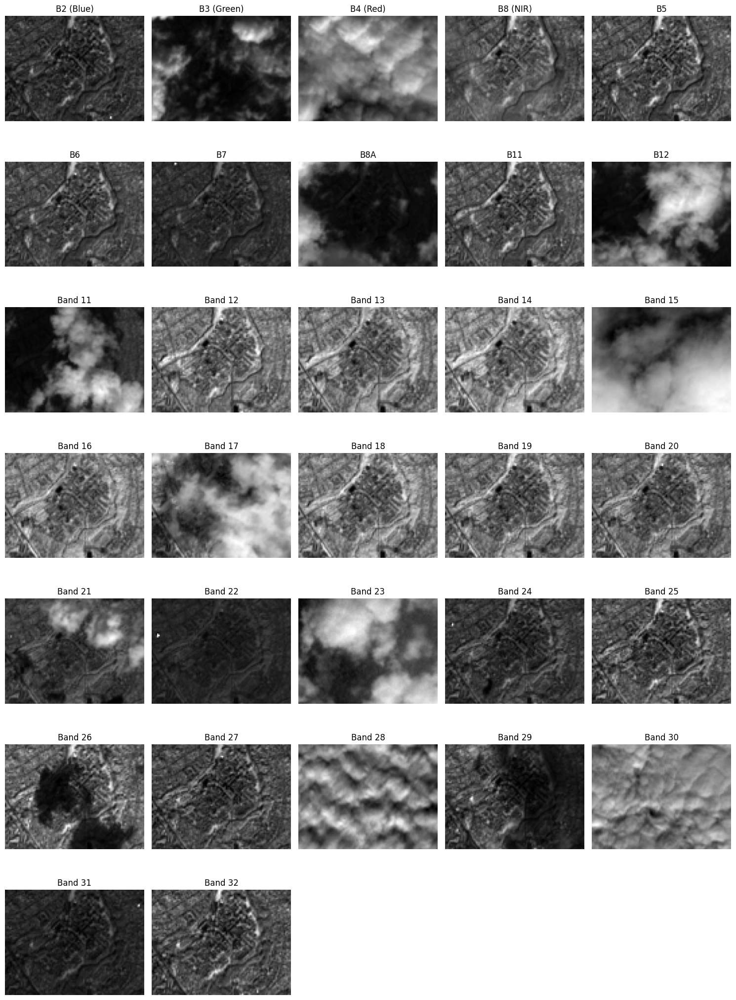

In [13]:
# Load and visualize Sentinel-2 data
import numpy as np
import matplotlib.pyplot as plt

# Load the Sentinel-2 data
sen_file_path = '/home/prajter/PycharmProjects/Flair-2/data/flair_2_toy_sen_train/D091_2021/Z14_UU/sen/SEN2_sp_D091_2021-Z14_UU_data.npy'
sentinel_data = np.load(sen_file_path)
file_path = '/home/prajter/PycharmProjects/Flair-2/data/flair_2_toy_aerial_train/D091_2021/Z14_UU/img/IMG_061062.tif'


# Print basic information about the data
print(f"Sentinel data shape: {sentinel_data.shape}")
print(f"Data type: {sentinel_data.dtype}")
print(f"Min value: {np.min(sentinel_data)}, Max value: {np.max(sentinel_data)}")

# Let's examine the structure further
print(f"Number of dimensions: {sentinel_data.ndim}")
for i in range(sentinel_data.ndim):
    print(f"Dimension {i} size: {sentinel_data.shape[i]}")

# Function to normalize data for visualization
def normalize_for_vis(band):
    """Normalize array to 0-1 range for visualization"""
    min_val = np.percentile(band, 2)
    max_val = np.percentile(band, 98)
    normalized = np.clip((band - min_val) / (max_val - min_val), 0, 1)
    return normalized

# Adjust the visualization based on the actual data structure
# If the data is in format [bands, timesteps, height, width]
if sentinel_data.ndim == 4:
    # Take the first timestamp or average over time
    # Here we'll use the first timestamp
    first_timestep = 5
    data_to_visualize = sentinel_data[:, first_timestep, :, :]
    print(f"Using timestep {first_timestep}, shape: {data_to_visualize.shape}")
else:
    data_to_visualize = sentinel_data

# Create a figure for different band combinations
plt.figure(figsize=(15, 10))

# True Color (RGB): Red = B4, Green = B3, Blue = B2
if data_to_visualize.shape[0] >= 4:  # Make sure we have enough bands
    rgb = np.zeros((data_to_visualize.shape[1], data_to_visualize.shape[2], 3))
    rgb[:, :, 0] = normalize_for_vis(data_to_visualize[2, :, :])  # Red (B4)
    rgb[:, :, 1] = normalize_for_vis(data_to_visualize[1, :, :])  # Green (B3)
    rgb[:, :, 2] = normalize_for_vis(data_to_visualize[0, :, :])  # Blue (B2)
    
    plt.subplot(2, 2, 1)
    plt.imshow(rgb)
    plt.title('True Color (RGB)')
    plt.axis('off')

# False Color / NIR (Near Infrared): NIR = B8, Red = B4, Green = B3
if data_to_visualize.shape[0] >= 4:
    nir_false_color = np.zeros((data_to_visualize.shape[1], data_to_visualize.shape[2], 3))
    nir_false_color[:, :, 0] = normalize_for_vis(data_to_visualize[3, :, :])  # NIR (B8)
    nir_false_color[:, :, 1] = normalize_for_vis(data_to_visualize[2, :, :])  # Red (B4)
    nir_false_color[:, :, 2] = normalize_for_vis(data_to_visualize[1, :, :])  # Green (B3)
    
    plt.subplot(2, 2, 2)
    plt.imshow(nir_false_color)
    plt.title('NIR False Color (NIR-R-G)')
    plt.axis('off')

# SWIR composite (for soil and geology): SWIR2 = B12, SWIR1 = B11, Red = B4
if data_to_visualize.shape[0] >= 10:
    swir_composite = np.zeros((data_to_visualize.shape[1], data_to_visualize.shape[2], 3))
    swir_composite[:, :, 0] = normalize_for_vis(data_to_visualize[9, :, :])  # SWIR2 (B12)
    swir_composite[:, :, 1] = normalize_for_vis(data_to_visualize[8, :, :])  # SWIR1 (B11)
    swir_composite[:, :, 2] = normalize_for_vis(data_to_visualize[2, :, :])  # Red (B4)
    
    plt.subplot(2, 2, 3)
    plt.imshow(swir_composite)
    plt.title('SWIR Composite (SWIR2-SWIR1-Red)')
    plt.axis('off')

# NDVI visualization (Normalized Difference Vegetation Index)
if data_to_visualize.shape[0] >= 4:
    nir = data_to_visualize[3, :, :]  # NIR (B8)
    red = data_to_visualize[2, :, :]  # Red (B4)
    
    # Calculate NDVI
    ndvi = np.zeros_like(nir)
    valid_mask = (nir + red) != 0
    ndvi[valid_mask] = (nir[valid_mask] - red[valid_mask]) / (nir[valid_mask] + red[valid_mask])
    
    plt.subplot(2, 2, 4)
    plt.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    plt.colorbar(shrink=0.8)
    plt.title('NDVI')
    plt.axis('off')

plt.tight_layout()
plt.show()

# If we have a time dimension, let's also show a time series for a specific band
if sentinel_data.ndim == 4:
    band_to_show = 2  # Red band (B4)
    n_timesteps = sentinel_data.shape[1]
    central_y = sentinel_data.shape[2] // 2
    central_x = sentinel_data.shape[3] // 2
    
    plt.figure(figsize=(10, 5))
    plt.plot(range(n_timesteps), sentinel_data[band_to_show, :, central_y, central_x])
    plt.title(f'Time series for Band {band_to_show} at center pixel')
    plt.xlabel('Time step')
    plt.ylabel('Pixel value')
    plt.grid(True)
    plt.show()

# Display individual bands
num_bands = data_to_visualize.shape[0]
band_names = ['B2 (Blue)', 'B3 (Green)', 'B4 (Red)', 'B8 (NIR)', 
              'B5', 'B6', 'B7', 'B8A', 'B11', 'B12']

# Determine number of rows and columns for the grid
ncols = 5
nrows = (num_bands + ncols - 1) // ncols

plt.figure(figsize=(15, 3 * nrows))
for i in range(num_bands):
    plt.subplot(nrows, ncols, i+1)
    if i < len(band_names):
        title = band_names[i]
    else:
        title = f'Band {i+1}'
    plt.imshow(data_to_visualize[i], cmap='gray')
    plt.title(title)
    plt.axis('off')
    
plt.tight_layout()
plt.show()

Sentinel data shape: (32, 10, 156, 207)
Data type: uint16
Min value: 0, Max value: 17053
Using time step 5 out of 10
Data shape for visualization: (32, 156, 207)


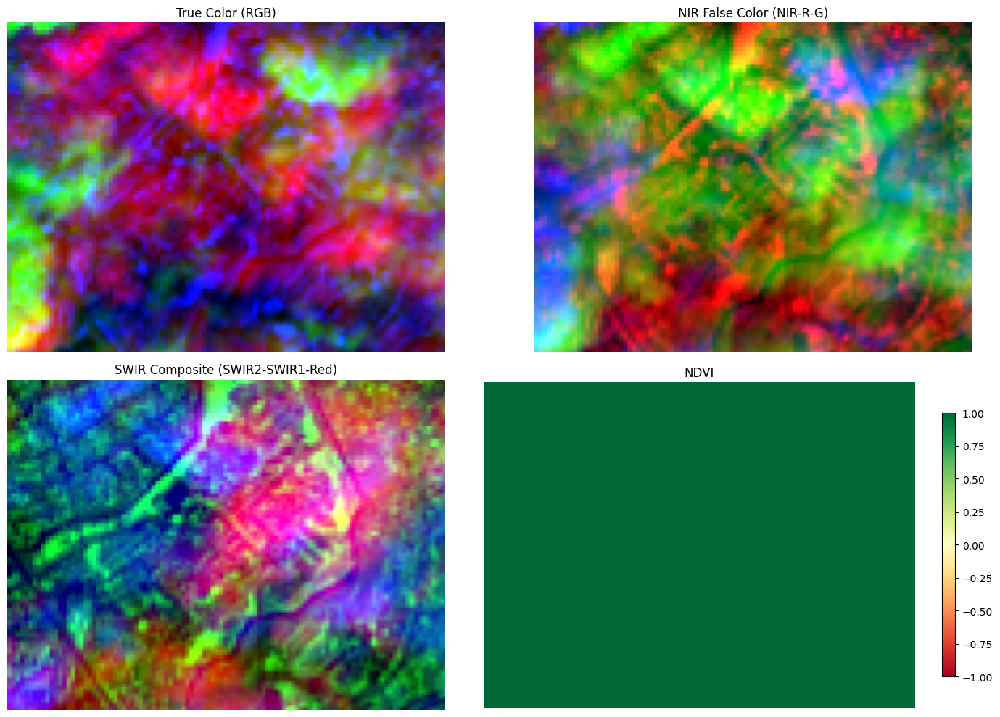

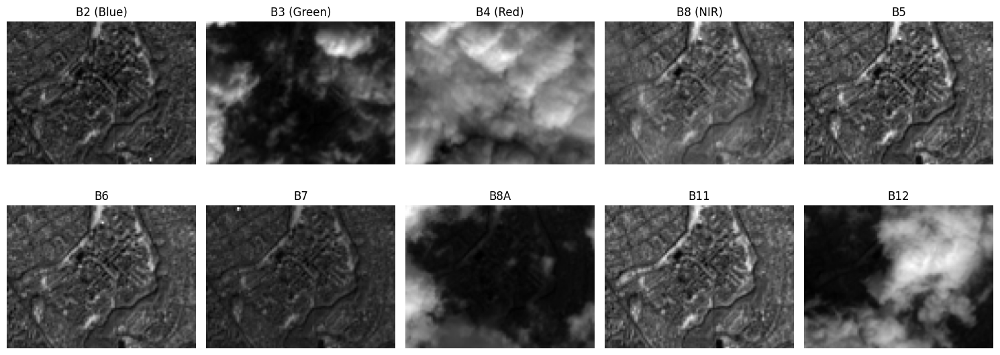

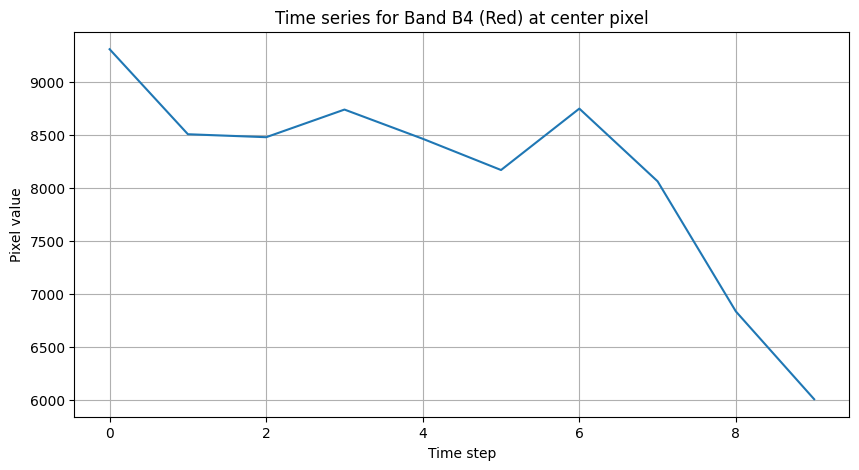

In [15]:
# Load and visualize Sentinel-2 data
import numpy as np
import matplotlib.pyplot as plt

# Load the Sentinel-2 data
sen_file_path = '/home/prajter/PycharmProjects/Flair-2/data/flair_2_toy_sen_train/D091_2021/Z14_UU/sen/SEN2_sp_D091_2021-Z14_UU_data.npy'
sentinel_data = np.load(sen_file_path)

# Print basic information about the data
print(f"Sentinel data shape: {sentinel_data.shape}")
print(f"Data type: {sentinel_data.dtype}")
print(f"Min value: {np.min(sentinel_data)}, Max value: {np.max(sentinel_data)}")

# If data has a time dimension ([bands, time, height, width])
if sentinel_data.ndim == 4:
    # For visualization, we'll use the first time step
    time_step = 5
    print(f"Using time step {time_step} out of {sentinel_data.shape[1]}")
    data = sentinel_data[:, time_step, :, :]
else:
    # Direct access if no time dimension
    data = sentinel_data

print(f"Data shape for visualization: {data.shape}")

# Function to normalize data for visualization
def normalize_for_vis(band):
    """Normalize array to 0-1 range for visualization"""
    min_val = np.percentile(band, 2)
    max_val = np.percentile(band, 98)
    normalized = np.clip((band - min_val) / (max_val - min_val), 0, 1)
    return normalized

# Create a figure for different band combinations
plt.figure(figsize=(15, 10))

# For Sentinel-2, the standard band order is:
# 0: B2 (Blue), 1: B3 (Green), 2: B4 (Red), 3: B8 (NIR), 
# 4: B5, 5: B6, 6: B7, 7: B8A, 8: B11, 9: B12

# True Color (RGB) - using bands 2 (Red), 1 (Green), 0 (Blue)
rgb = np.zeros((data.shape[1], data.shape[2], 3))
rgb[:, :, 0] = normalize_for_vis(data[2])  # Red
rgb[:, :, 1] = normalize_for_vis(data[1])  # Green
rgb[:, :, 2] = normalize_for_vis(data[0])  # Blue

plt.subplot(2, 2, 1)
plt.imshow(rgb)
plt.title('True Color (RGB)')
plt.axis('off')

# False Color / NIR - using bands 3 (NIR), 2 (Red), 1 (Green)
nir_false_color = np.zeros((data.shape[1], data.shape[2], 3))
nir_false_color[:, :, 0] = normalize_for_vis(data[3])  # NIR
nir_false_color[:, :, 1] = normalize_for_vis(data[2])  # Red
nir_false_color[:, :, 2] = normalize_for_vis(data[1])  # Green

plt.subplot(2, 2, 2)
plt.imshow(nir_false_color)
plt.title('NIR False Color (NIR-R-G)')
plt.axis('off')

# SWIR composite - using bands 9 (SWIR2), 8 (SWIR1), 2 (Red)
swir_composite = np.zeros((data.shape[1], data.shape[2], 3))
swir_composite[:, :, 0] = normalize_for_vis(data[9])  # SWIR2
swir_composite[:, :, 1] = normalize_for_vis(data[8])  # SWIR1
swir_composite[:, :, 2] = normalize_for_vis(data[2])  # Red

plt.subplot(2, 2, 3)
plt.imshow(swir_composite)
plt.title('SWIR Composite (SWIR2-SWIR1-Red)')
plt.axis('off')

# NDVI visualization
nir = data[3]  # NIR
red = data[2]  # Red

# Calculate NDVI
ndvi = np.zeros_like(nir)
valid_mask = (nir + red) != 0
ndvi[valid_mask] = (nir[valid_mask] - red[valid_mask]) / (nir[valid_mask] + red[valid_mask])

plt.subplot(2, 2, 4)
plt.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
plt.colorbar(shrink=0.8)
plt.title('NDVI')
plt.axis('off')

plt.tight_layout()
plt.show()

# Display individual bands
band_names = ['B2 (Blue)', 'B3 (Green)', 'B4 (Red)', 'B8 (NIR)', 
              'B5', 'B6', 'B7', 'B8A', 'B11', 'B12']

plt.figure(figsize=(15, 6))
for i in range(min(10, data.shape[0])):
    plt.subplot(2, 5, i+1)
    plt.imshow(data[i], cmap='gray')
    plt.title(band_names[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

# If there's a time dimension, show a time series for the center pixel of band 2 (Red)
if sentinel_data.ndim == 4:
    band_to_show = 2  # Red band
    central_y = sentinel_data.shape[2] // 2
    central_x = sentinel_data.shape[3] // 2
    
    plt.figure(figsize=(10, 5))
    plt.plot(range(sentinel_data.shape[1]), sentinel_data[band_to_show, :, central_y, central_x])
    plt.title(f'Time series for Band {band_names[band_to_show]} at center pixel')
    plt.xlabel('Time step')
    plt.ylabel('Pixel value')
    plt.grid(True)
    plt.show()

Sentinel data shape: (32, 10, 156, 207)
Data type: uint16
Min value: 0, Max value: 17053
Number of dimensions: 4
Dimension 0 size: 32
Dimension 1 size: 10
Dimension 2 size: 156
Dimension 3 size: 207
Using timestep 0, shape: (32, 156, 207)


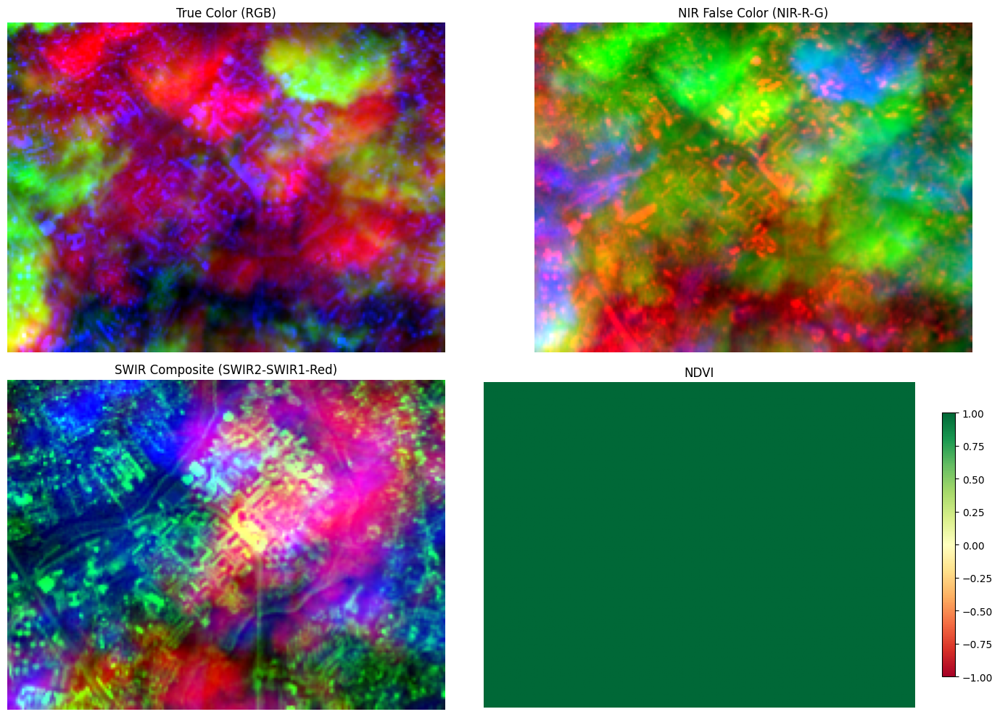

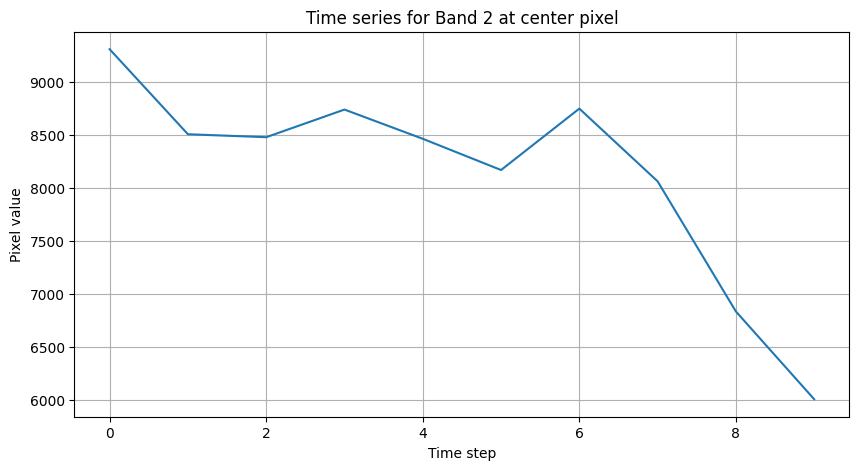

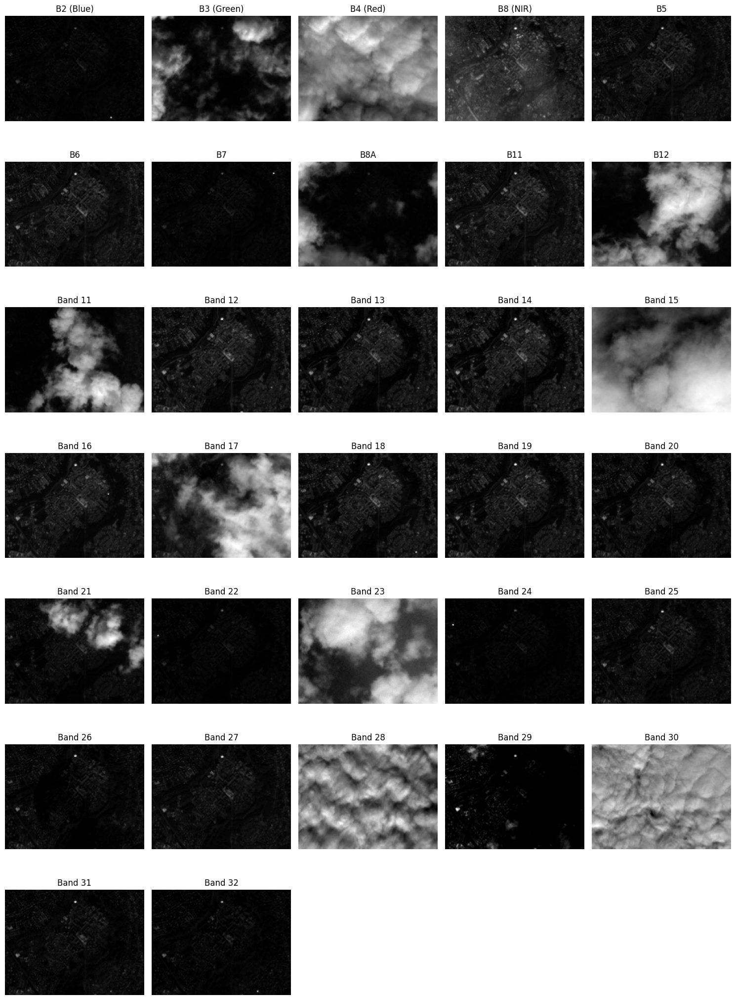

In [16]:
# Load and visualize Sentinel-2 data
import numpy as np
import matplotlib.pyplot as plt

# Load the Sentinel-2 data
sen_file_path = '/home/prajter/PycharmProjects/Flair-2/data/flair_2_toy_sen_train/D091_2021/Z14_UU/sen/SEN2_sp_D091_2021-Z14_UU_data.npy'
sentinel_data = np.load(sen_file_path)

# Print basic information about the data
print(f"Sentinel data shape: {sentinel_data.shape}")
print(f"Data type: {sentinel_data.dtype}")
print(f"Min value: {np.min(sentinel_data)}, Max value: {np.max(sentinel_data)}")

# Let's examine the structure further
print(f"Number of dimensions: {sentinel_data.ndim}")
for i in range(sentinel_data.ndim):
    print(f"Dimension {i} size: {sentinel_data.shape[i]}")

# Function to normalize data for visualization
def normalize_for_vis(band):
    """Normalize array to 0-1 range for visualization"""
    min_val = np.percentile(band, 2)
    max_val = np.percentile(band, 98)
    normalized = np.clip((band - min_val) / (max_val - min_val), 0, 1)
    return normalized

# Adjust the visualization based on the actual data structure
# If the data is in format [bands, timesteps, height, width]
if sentinel_data.ndim == 4:
    # Take the first timestamp or average over time
    # Here we'll use the first timestamp
    first_timestep = 0
    data_to_visualize = sentinel_data[:, first_timestep, :, :]
    print(f"Using timestep {first_timestep}, shape: {data_to_visualize.shape}")
else:
    data_to_visualize = sentinel_data

# Create a figure for different band combinations
plt.figure(figsize=(15, 10))

# True Color (RGB): Red = B4, Green = B3, Blue = B2
if data_to_visualize.shape[0] >= 4:  # Make sure we have enough bands
    rgb = np.zeros((data_to_visualize.shape[1], data_to_visualize.shape[2], 3))
    rgb[:, :, 0] = normalize_for_vis(data_to_visualize[2, :, :])  # Red (B4)
    rgb[:, :, 1] = normalize_for_vis(data_to_visualize[1, :, :])  # Green (B3)
    rgb[:, :, 2] = normalize_for_vis(data_to_visualize[0, :, :])  # Blue (B2)
    
    plt.subplot(2, 2, 1)
    plt.imshow(rgb)
    plt.title('True Color (RGB)')
    plt.axis('off')

# False Color / NIR (Near Infrared): NIR = B8, Red = B4, Green = B3
if data_to_visualize.shape[0] >= 4:
    nir_false_color = np.zeros((data_to_visualize.shape[1], data_to_visualize.shape[2], 3))
    nir_false_color[:, :, 0] = normalize_for_vis(data_to_visualize[3, :, :])  # NIR (B8)
    nir_false_color[:, :, 1] = normalize_for_vis(data_to_visualize[2, :, :])  # Red (B4)
    nir_false_color[:, :, 2] = normalize_for_vis(data_to_visualize[1, :, :])  # Green (B3)
    
    plt.subplot(2, 2, 2)
    plt.imshow(nir_false_color)
    plt.title('NIR False Color (NIR-R-G)')
    plt.axis('off')

# SWIR composite (for soil and geology): SWIR2 = B12, SWIR1 = B11, Red = B4
if data_to_visualize.shape[0] >= 10:
    swir_composite = np.zeros((data_to_visualize.shape[1], data_to_visualize.shape[2], 3))
    swir_composite[:, :, 0] = normalize_for_vis(data_to_visualize[9, :, :])  # SWIR2 (B12)
    swir_composite[:, :, 1] = normalize_for_vis(data_to_visualize[8, :, :])  # SWIR1 (B11)
    swir_composite[:, :, 2] = normalize_for_vis(data_to_visualize[2, :, :])  # Red (B4)
    
    plt.subplot(2, 2, 3)
    plt.imshow(swir_composite)
    plt.title('SWIR Composite (SWIR2-SWIR1-Red)')
    plt.axis('off')

# NDVI visualization (Normalized Difference Vegetation Index)
if data_to_visualize.shape[0] >= 4:
    nir = data_to_visualize[3, :, :]  # NIR (B8)
    red = data_to_visualize[2, :, :]  # Red (B4)
    
    # Calculate NDVI
    ndvi = np.zeros_like(nir)
    valid_mask = (nir + red) != 0
    ndvi[valid_mask] = (nir[valid_mask] - red[valid_mask]) / (nir[valid_mask] + red[valid_mask])
    
    plt.subplot(2, 2, 4)
    plt.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    plt.colorbar(shrink=0.8)
    plt.title('NDVI')
    plt.axis('off')

plt.tight_layout()
plt.show()

# If we have a time dimension, let's also show a time series for a specific band
if sentinel_data.ndim == 4:
    band_to_show = 2  # Red band (B4)
    n_timesteps = sentinel_data.shape[1]
    central_y = sentinel_data.shape[2] // 2
    central_x = sentinel_data.shape[3] // 2
    
    plt.figure(figsize=(10, 5))
    plt.plot(range(n_timesteps), sentinel_data[band_to_show, :, central_y, central_x])
    plt.title(f'Time series for Band {band_to_show} at center pixel')
    plt.xlabel('Time step')
    plt.ylabel('Pixel value')
    plt.grid(True)
    plt.show()

# Display individual bands
num_bands = data_to_visualize.shape[0]
band_names = ['B2 (Blue)', 'B3 (Green)', 'B4 (Red)', 'B8 (NIR)', 
              'B5', 'B6', 'B7', 'B8A', 'B11', 'B12']

# Determine number of rows and columns for the grid
ncols = 5
nrows = (num_bands + ncols - 1) // ncols

plt.figure(figsize=(15, 3 * nrows))
for i in range(num_bands):
    plt.subplot(nrows, ncols, i+1)
    if i < len(band_names):
        title = band_names[i]
    else:
        title = f'Band {i+1}'
    plt.imshow(data_to_visualize[i], cmap='gray')
    plt.title(title)
    plt.axis('off')
    
plt.tight_layout()
plt.show()

Sentinel data shape: (29, 10, 156, 309)
Data type: uint16
Min value: 0, Max value: 13833
Number of timestamps: 29
Number of channels: 10
Image height: 156
Image width: 309
Using timestamp 15 out of 29
NIR min: 227, max: 3557, średnia: 1406.4713509252344
Red min: 100, max: 4187, średnia: 868.4004439465605
NDVI min: 0.0, max: 55.99658203125, średnia: 0.4177604019641876
Liczba pikseli z NDVI > 0.3: 18727
Liczba pikseli z NDVI < 0: 0


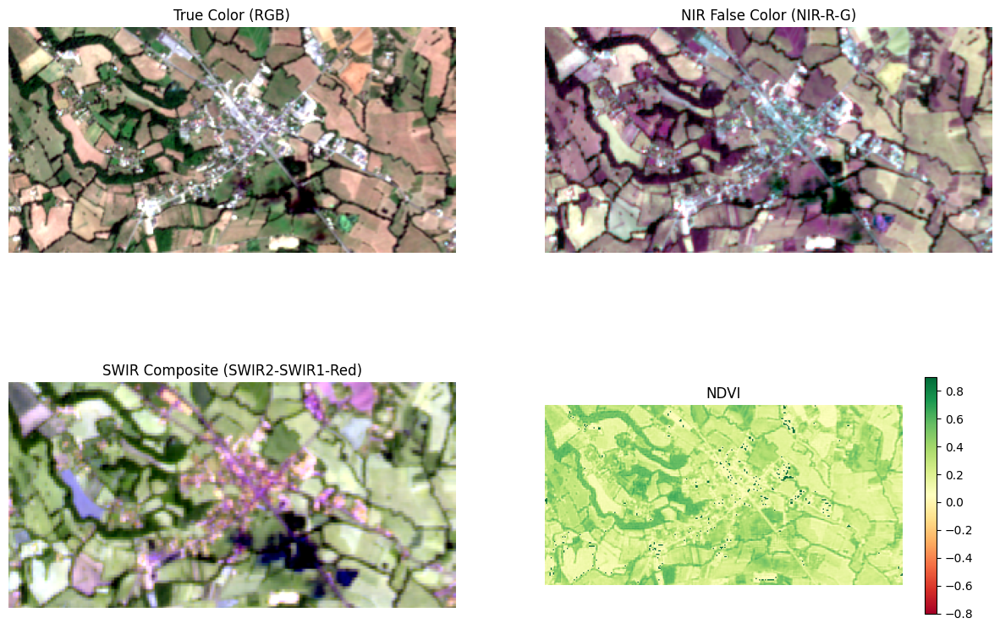

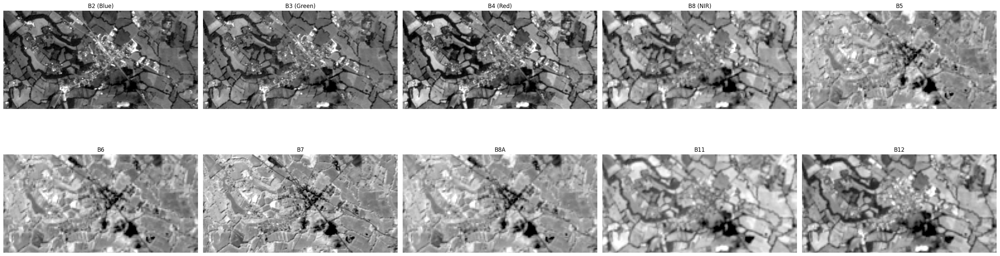

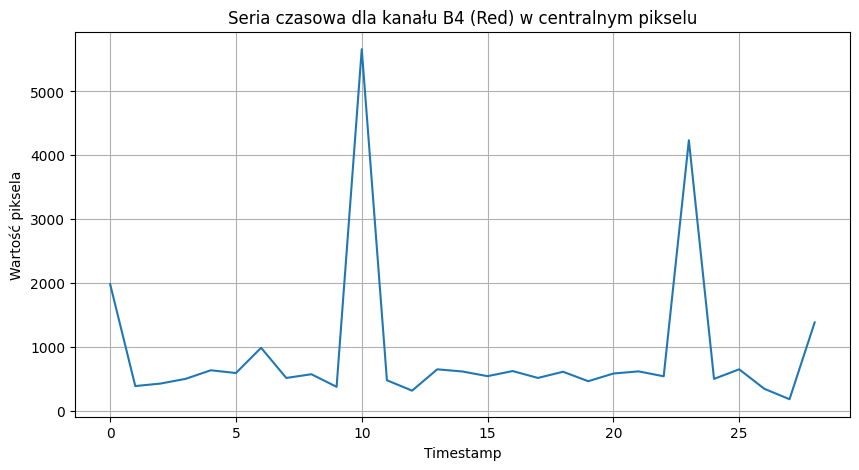

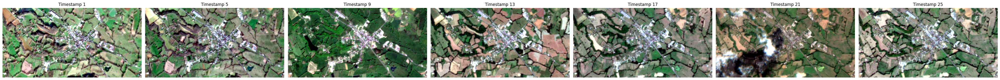

In [43]:
# Load and visualize Sentinel-2 data
import numpy as np
import matplotlib.pyplot as plt

# Load the Sentinel-2 data
sen_file_path = '/home/prajter/PycharmProjects/Flair-2/data/flair_2_toy_sen_train/D046_2019/Z24_UA/sen/SEN2_sp_D046_2019-Z24_UA_data.npy'
sentinel_data = np.load(sen_file_path)

# Print basic information about the data
print(f"Sentinel data shape: {sentinel_data.shape}")
print(f"Data type: {sentinel_data.dtype}")
print(f"Min value: {np.min(sentinel_data)}, Max value: {np.max(sentinel_data)}")

# Poprawiona interpretacja wymiarów
print(f"Number of timestamps: {sentinel_data.shape[0]}")
print(f"Number of channels: {sentinel_data.shape[1]}")
print(f"Image height: {sentinel_data.shape[2]}")
print(f"Image width: {sentinel_data.shape[3]}")

# Wybierz jeden timestamp do wizualizacji
time_step = 15  # Wybierz środkowy timestamp dla reprezentatywnego obrazu
print(f"Using timestamp {time_step} out of {sentinel_data.shape[0]}")

# Dla wybranego timestamp, pobierz dane dla wszystkich kanałów
data = sentinel_data[time_step]  # Shape: [10, 156, 207]

# Funkcja normalizacji z korekcją gamma dla lepszego efektu wizualnego
def normalize_for_vis(band, percentile_min=2, percentile_max=98, gamma=1.4):
    """Normalize array to 0-1 range with gamma correction for better visualization"""
    min_val = np.percentile(band, percentile_min)
    max_val = np.percentile(band, percentile_max)
    if max_val > min_val:
        normalized = (band - min_val) / (max_val - min_val)
    else:
        normalized = np.zeros_like(band)
    
    # Zastosuj korekcję gamma
    normalized = np.power(np.clip(normalized, 0, 1), 1/gamma)
    return normalized

# Funkcja tworząca kompozycję RGB z trzech kanałów
def create_rgb_composite(r_band, g_band, b_band, r_gain=1.0, g_gain=1.0, b_gain=1.0):
    """Create an RGB composite with balanced colors and gains"""
    rgb = np.zeros((r_band.shape[0], r_band.shape[1], 3))
    
    # Zastosuj wzmocnienie do każdego kanału dla lepszej wizualizacji
    rgb[:, :, 0] = normalize_for_vis(r_band) * r_gain
    rgb[:, :, 1] = normalize_for_vis(g_band) * g_gain
    rgb[:, :, 2] = normalize_for_vis(b_band) * b_gain
    
    # Przytnij do zakresu 0-1
    return np.clip(rgb, 0, 1)

# Utwórz rysunek dla różnych kompozycji kanałów
plt.figure(figsize=(15, 10))

# Naturalne kolory (RGB): Czerwony = B4, Zielony = B3, Niebieski = B2
# Uwaga: W Sentinel-2 indeksy to:
# data[0]=B2, data[1]=B3, data[2]=B4, data[3]=B8 itd.
rgb = create_rgb_composite(
    data[2],  # Czerwony (B4)
    data[1],  # Zielony (B3)
    data[0],  # Niebieski (B2)
    r_gain=1.1,  # Lekkie wzmocnienie czerwieni dla lepszego efektu
    g_gain=1.0,
    b_gain=1.0
)

plt.subplot(2, 2, 1)
plt.imshow(rgb)
plt.title('True Color (RGB)')
plt.axis('off')

# Fałszywy kolor z NIR: NIR = B8, Czerwony = B4, Zielony = B3
nir_false_color = create_rgb_composite(
    data[3],  # NIR (B8)
    data[2],  # Czerwony (B4)
    data[1]   # Zielony (B3)
)

plt.subplot(2, 2, 2)
plt.imshow(nir_false_color)
plt.title('NIR False Color (NIR-R-G)')
plt.axis('off')

# Kompozycja SWIR: SWIR2 = B12, SWIR1 = B11, Czerwony = B4
swir_composite = create_rgb_composite(
    data[9],  # SWIR2 (B12)
    data[8],  # SWIR1 (B11)
    data[2]   # Czerwony (B4)
)

plt.subplot(2, 2, 3)
plt.imshow(swir_composite)
plt.title('SWIR Composite (SWIR2-SWIR1-Red)')
plt.axis('off')

# Wizualizacja NDVI
nir = data[3]  # NIR (B8)
red = data[2]  # Czerwony (B4)

# Sprawdź wartości NIR i Red przed obliczeniem NDVI
print(f"NIR min: {np.min(nir)}, max: {np.max(nir)}, średnia: {np.mean(nir)}")
print(f"Red min: {np.min(red)}, max: {np.max(red)}, średnia: {np.mean(red)}")

# Oblicz NDVI z lepszym zabezpieczeniem przed dzieleniem przez zero
ndvi = np.zeros_like(nir, dtype=np.float32)
valid_mask = (nir + red > 0.001)  # Unikaj dzielenia przez bardzo małe wartości
ndvi[valid_mask] = (nir[valid_mask] - red[valid_mask]) / (nir[valid_mask] + red[valid_mask])

# Sprawdź wartości NDVI
print(f"NDVI min: {np.min(ndvi)}, max: {np.max(ndvi)}, średnia: {np.mean(ndvi)}")
print(f"Liczba pikseli z NDVI > 0.3: {np.sum(ndvi > 0.3)}")
print(f"Liczba pikseli z NDVI < 0: {np.sum(ndvi < 0)}")

# Zastosuj dodatkowe przetwarzanie dla lepszej wizualizacji
# Przytnij bardzo ekstremalne wartości, które mogą być wynikiem błędów
ndvi_viz = np.clip(ndvi, -0.8, 0.9)

plt.subplot(2, 2, 4)
plt.imshow(ndvi_viz, cmap='RdYlGn', vmin=-0.8, vmax=0.9)
plt.colorbar(shrink=0.8)
plt.title('NDVI')
plt.axis('off')
# Wyświetl pojedyncze kanały
band_names = ['B2 (Blue)', 'B3 (Green)', 'B4 (Red)', 'B8 (NIR)', 
              'B5', 'B6', 'B7', 'B8A', 'B11', 'B12']

plt.figure(figsize=(30, 10))
for i in range(min(10, data.shape[0])):
    plt.subplot(2, 5, i+1)
    # Poprawiona normalizacja dla lepszej wizualizacji pojedynczych kanałów
    plt.imshow(normalize_for_vis(data[i], 1, 99.5), cmap='gray')
    plt.title(band_names[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

# Wizualizacja serii czasowej dla wybranego kanału i piksela
band_to_show = 2  # Kanał czerwony (B4)
central_y = sentinel_data.shape[2] // 2
central_x = sentinel_data.shape[3] // 2

plt.figure(figsize=(10, 5))
plt.plot(range(sentinel_data.shape[0]), sentinel_data[:, band_to_show, central_y, central_x])
plt.title(f'Seria czasowa dla kanału {band_names[band_to_show]} w centralnym pikselu')
plt.xlabel('Timestamp')
plt.ylabel('Wartość piksela')
plt.grid(True)
plt.show()

# Pokaż zmiany w czasie dla wybranego obszaru (animacja nie jest możliwa w zwykłym notebooku)
# Wyświetlimy zatem kilka wybranych timestampów dla kompozycji true color
plt.figure(figsize=(40, 15))
timestamps_to_show = range(1,28,4)  # Wybrane timestampy do wyświetlenia

for i, ts in enumerate(timestamps_to_show):
    plt.subplot(1, len(timestamps_to_show), i+1)
    # Pobierz dane dla tego timestamp
    ts_data = sentinel_data[ts]
    
    # Utwórz kompozycję true color
    rgb = create_rgb_composite(
        ts_data[2],  # Czerwony (B4)
        ts_data[1],  # Zielony (B3)
        ts_data[0]   # Niebieski (B2)
    )
    
    plt.imshow(rgb)
    plt.title(f'Timestamp {ts}')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [26]:
flair_cmap = {
    0: "#db0e9a",
    1: "#938e7b",
    2: "#f80c00",
    3: "#a97101",
    4: "#1553ae",
    5: "#194a26",
    6: "#46e483",
    7: "#f3a60d",
    8: "#660082",
    9: "#55ff00",
    10: "#fff30d",
    11: "#e4df7c",
    12: "#000000",
}

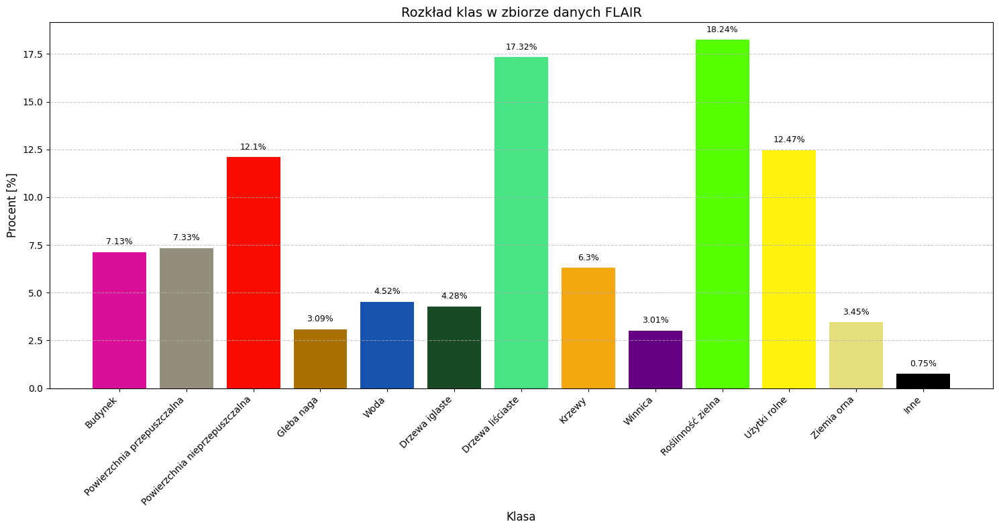

In [27]:
import matplotlib.pyplot as plt
import numpy as np

# Class percentages from your data
percentages = [7.13, 7.33, 12.1, 3.09, 4.52, 4.28, 17.32, 6.3, 3.01, 18.24, 12.47, 3.45, 0.75]

# Polish class names
msk_to_name_polish = {
    0: "Budynek",
    1: "Powierzchnia przepuszczalna",
    2: "Powierzchnia nieprzepuszczalna",
    3: "Gleba naga",
    4: "Woda",
    5: "Drzewa iglaste",
    6: "Drzewa liściaste",
    7: "Krzewy",
    8: "Winnica",
    9: "Roślinność zielna",
    10: "Użytki rolne",
    11: "Ziemia orna",
    12: "Inne"
}

# Colors from flair_cmap
colors = [flair_cmap[i] for i in range(13)]

# Create figure with larger size to accommodate long labels
plt.figure(figsize=(15, 8))

# Create the bar plot
bars = plt.bar(range(13), percentages, color=colors)

# Add percentage labels on top of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.3,
            f'{percentages[i]}%', ha='center', va='bottom', fontsize=9)

# Set x-ticks with Polish class names
plt.xticks(range(13), [msk_to_name_polish[i] for i in range(13)], rotation=45, ha='right')

# Set labels and title
plt.xlabel('Klasa', fontsize=12)
plt.ylabel('Procent [%]', fontsize=12)
plt.title('Rozkład klas w zbiorze danych FLAIR', fontsize=14)

# Add grid lines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout to make room for rotated x labels
plt.tight_layout()

plt.show()